------
<h1>
    <center>
        Sentinel-2A Image Preprocessing <b><br>
    </center>
</h1>

------


## Imports of Required Packages and Setup

### Import Python packages

In [1]:
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
from natsort import natsorted
import rasterio as rio


### Import of customized modules

In [2]:
# Add local module to the path
src = os.path.abspath('../scripts')
if src not in sys.path:
    sys.path.append(src)
    # sys.path.insert(0, src)


In [3]:
### Import functions
import utils as s2u
import spectral_tools as spt
import raster_preprocessing as rpp
from mkdir import check_create_dir


## Raster Image (S2) Preprocessing 

### Define working directories

In [4]:
### Define working base path
root = os.path.abspath("../../../../../UMP/Deliverables")
root


'/Users/ldjeutsch/PYTHON-DATA-SCI/UMP/Deliverables'

In [25]:
# Define working path 
input_dir = os.path.join(root, "inputs")
plot_dir = os.path.join(root, "figures")
image_dir = os.path.join(input_dir, "Ibadan/S2")
output_dir = os.path.join(root, "outputs")
proc_data_dir = os.path.join(output_dir, "processed-data")
spectral_indices_dir = os.path.join(proc_data_dir, "Ibadan/S2/spectral_indices")
textural_indices_dir = os.path.join(proc_data_dir, "Ibadan/S2/textural_indices")
patch_dir = os.path.join(proc_data_dir, "Ibadan/S2/patches")
model_dir = os.path.join(output_dir, "models")
results_dir = os.path.join(output_dir, "results")


In [26]:
### Check and create output data directory if needed
list_directories = [input_dir, plot_dir, image_dir, output_dir, spectral_indices_dir,
                    textural_indices_dir, patch_dir, model_dir, results_dir, proc_data_dir]
for path in list_directories:
    check_create_dir(path) 


The folder '/Users/ldjeutsch/PYTHON-DATA-SCI/UMP/Deliverables/inputs' already exists
The folder '/Users/ldjeutsch/PYTHON-DATA-SCI/UMP/Deliverables/figures' already exists
The folder '/Users/ldjeutsch/PYTHON-DATA-SCI/UMP/Deliverables/inputs/Ibadan/S2' already exists
The folder '/Users/ldjeutsch/PYTHON-DATA-SCI/UMP/Deliverables/outputs' already exists
The folder '/Users/ldjeutsch/PYTHON-DATA-SCI/UMP/Deliverables/outputs/processed-data/Ibadan/S2/spectral_indices' has been created
The folder '/Users/ldjeutsch/PYTHON-DATA-SCI/UMP/Deliverables/outputs/processed-data/Ibadan/S2/textural_indices' has been created
The folder '/Users/ldjeutsch/PYTHON-DATA-SCI/UMP/Deliverables/outputs/processed-data/Ibadan/S2/patches' already exists
The folder '/Users/ldjeutsch/PYTHON-DATA-SCI/UMP/Deliverables/outputs/models' already exists
The folder '/Users/ldjeutsch/PYTHON-DATA-SCI/UMP/Deliverables/outputs/results' already exists
The folder '/Users/ldjeutsch/PYTHON-DATA-SCI/UMP/Deliverables/outputs/processed-da

In [7]:
# Create a list of all the filenames of images
tile_list = [x for x in os.listdir(image_dir) if x.endswith(".tif")]

# Sort the list naturally based on the number in the filename.
tile_list = natsorted(tile_list)

tile_list


['S2_Agugu_2022-09-01_2022-12-31_file1.tif',
 'S2_Ibadan_2022-09-01_2022-12-31_file1.tif',
 'S2_Ibadan_2022-09-01_2022-12-31_file2.tif']

### Load rasters from the defined image directory

In [8]:
# Loop over and open all the images
tile_ds = []
for i, tile in enumerate(tile_list): 
    ds = rio.open(image_dir + os.path.sep + tile)
    tile_ds.append(ds)

    print(f"Tile {i}: {ds.read().shape} -> {tile}")


Tile 0: (11, 2615, 3012) -> S2_Agugu_2022-09-01_2022-12-31_file1.tif
Tile 1: (11, 2148, 2779) -> S2_Ibadan_2022-09-01_2022-12-31_file1.tif
Tile 2: (11, 2148, 2779) -> S2_Ibadan_2022-09-01_2022-12-31_file2.tif


### Resample the original images to a regular size


In [9]:
# Loop over and read all the images as numpy array, then stack them together 
resizesize = 2048 # Resampling size
img_stack = []
for ds in tile_ds:
    data = ds.read(out_shape=(resizesize, resizesize)) # Resize (resample) raw data 
    data = np.transpose(data,(1, 2, 0)) # Swap the axises to make the number of bands as the final dimension. 
    img_stack.append(data)

# Now, change the list into numpy array 
img_stack = np.array(img_stack)
print(img_stack.shape)


(3, 2048, 2048, 11)


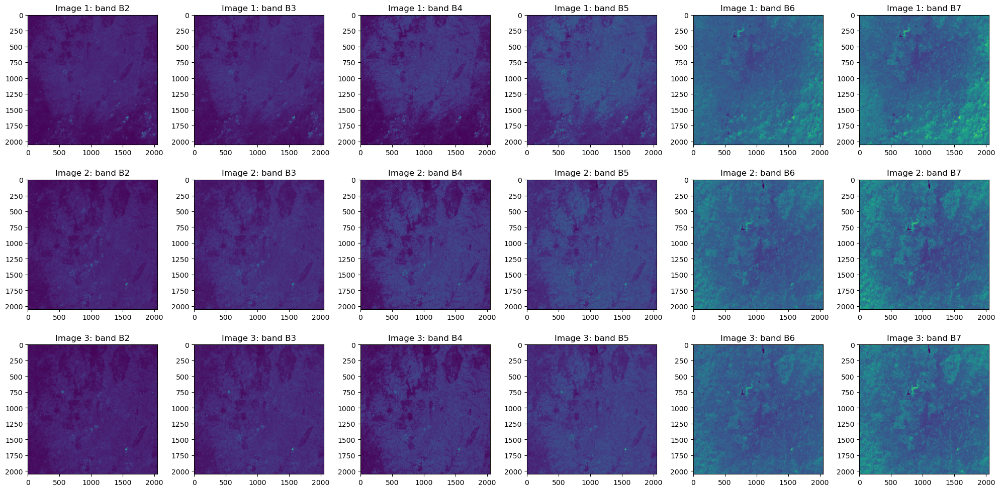

In [10]:
fig, ax = plt.subplots(len(tile_list), 6, figsize=(20, 10))

for i in range(len(tile_list)):
    for j in range(6):
        ax[i, j].imshow(img_stack[i, :, :, j])
        ax[i, j].set_title(f'Image {i+1}: band B{j+2}')

fig.tight_layout();

### Save the figure
# plot_path = os.path.join(plot_dir, "spectral_bands_Ibadan.pdf")
# fig.savefig(plot_path, bbox_inches='tight', dpi=300)


### Preprocess and plot the True Color Image (RGB)

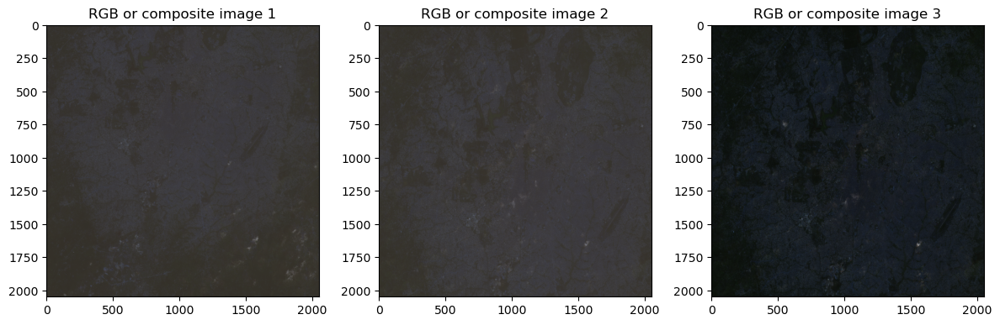

In [11]:
fig, ax = plt.subplots(1, 3, figsize=(12, 18))

for i in range(3):
    ax[i].imshow(img_stack[i, :, :, :3])
    ax[i].set_title(f'RGB or composite image {i+1}')

fig.tight_layout();

### Save the figure
# plot_path = os.path.join(plot_dir, "RGB_composite_Ibadan.pdf")
# fig.savefig(plot_path, bbox_inches='tight', dpi=300)


## Advanced Sentinel-2A Images Preprocessing  

### Set some global parameters

In [10]:
### Set some global parameters: pathes, files, and image size
file_path = os.path.join(image_dir, tile_list[1])
target_height, target_width = 2048, 2048
patch_size = 256
#
patch_dir = os.path.join(proc_data_dir, "Ibadan/S2/patches")
enhanced_patch_dir = os.path.join(proc_data_dir, "Ibadan/S2/enhanced_patches")
check_create_dir(patch_dir)
check_create_dir(enhanced_patch_dir)
#
resized_output_file = os.path.join(proc_data_dir, f"Ibadan/S2", f"{tile_list[1].split('.')[0]}_resized_{target_height}x{target_width}.tif")
enhanced_output_file = os.path.join(proc_data_dir, f"Ibadan/S2", f"{tile_list[1].split('.')[0]}_enhanced_{target_height}x{target_width}.tif")
print(resized_output_file)
print(enhanced_output_file)


The folder '/Users/ldjeutsch/PYTHON-DATA-SCI/UMP/Deliverables/outputs/processed-data/Ibadan/S2/patches' already exists
The folder '/Users/ldjeutsch/PYTHON-DATA-SCI/UMP/Deliverables/outputs/processed-data/Ibadan/S2/enhanced_patches' already exists
/Users/ldjeutsch/PYTHON-DATA-SCI/UMP/Deliverables/outputs/processed-data/Ibadan/S2/S2_Ibadan_2022-09-01_2022-12-31_file1_resized_2048x2048.tif
/Users/ldjeutsch/PYTHON-DATA-SCI/UMP/Deliverables/outputs/processed-data/Ibadan/S2/S2_Ibadan_2022-09-01_2022-12-31_file1_enhanced_2048x2048.tif


### Open, Read, Resize, Enhance, Create Patches and Save 


In [11]:
### Step 1: Read the Sentinel-2A image
image_data, metadata = rpp.read_sentinel_image(file_path)

### Step 2: Resize the image
resized_image = rpp.resize_image(image_data, target_height, target_width)

### Step 3: Enhance the image
enhanced_image_data = rpp.enhance_image(resized_image)

### Step 4: Save the resized image
rpp.save_image(resized_image, resized_output_file, metadata)
rpp.save_image(resized_image, enhanced_output_file, metadata)

### Step 5: Create patches
patches = rpp.create_patches(resized_image, patch_size)
enhanced_patches = rpp.create_patches(enhanced_image_data, patch_size)

### Step 6: Save the patches as individual .tiff files
rpp.save_patches(patches, patch_dir, metadata)
rpp.save_patches(patches, enhanced_patch_dir, metadata)


The folder '/Users/ldjeutsch/PYTHON-DATA-SCI/UMP/Deliverables/outputs/processed-data/Ibadan/S2/patches' already exists
The folder '/Users/ldjeutsch/PYTHON-DATA-SCI/UMP/Deliverables/outputs/processed-data/Ibadan/S2/enhanced_patches' already exists


## Make a few visualizations

### Read the resized image and show the true image as a whole

/Users/ldjeutsch/PYTHON-DATA-SCI/UMP/Deliverables/outputs/processed-data/Ibadan/S2/S2_Ibadan_2022-09-01_2022-12-31_file1_resized_2048x2048.tif


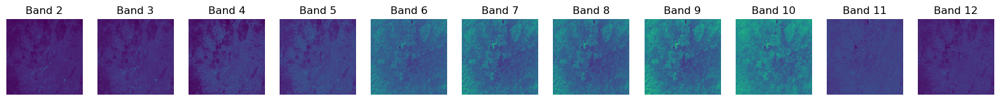

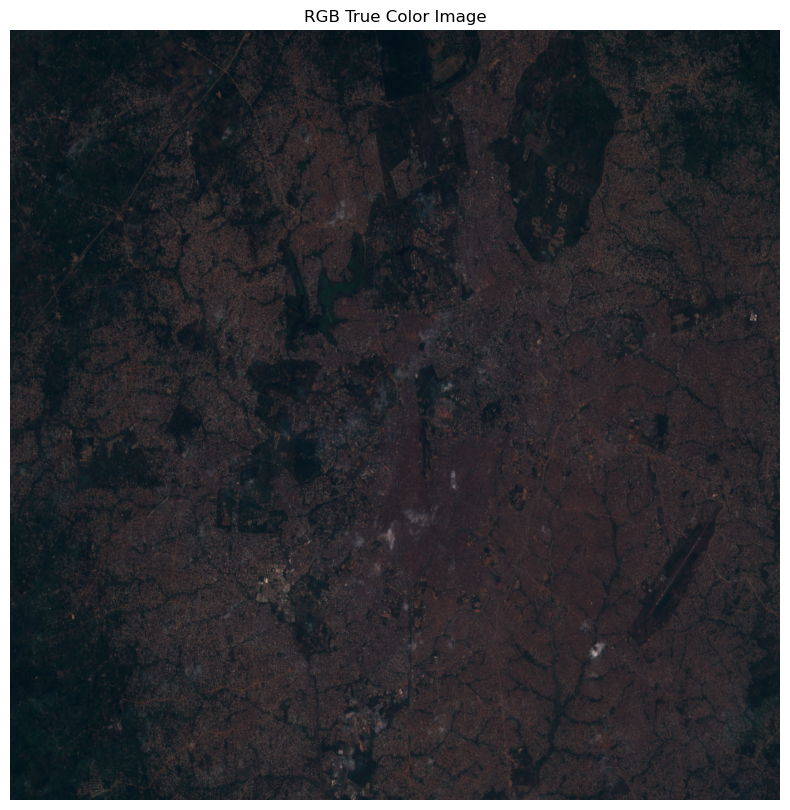

In [12]:
# Example usage
print(resized_output_file)

# Step 1: Open the raster image
image_data, metadata = rpp.read_sentinel_image(resized_output_file)

# Step 2: Plot all the bands and save the figure
fig = s2u.plot_bands(image_data)
plot_path = os.path.join(plot_dir, "resized_spectral_bands_Ibadan.pdf")
fig.savefig(plot_path, bbox_inches='tight', dpi=300)


# Step 3: Plot the RGB true color image
# Note: Modify the rgb_indices based on the specific bands in your dataset
fig = s2u.plot_rgb(image_data, rgb_indices=(3, 2, 1))
plot_path = os.path.join(plot_dir, "RGB_or_composite_resized_image_Ibadan.pdf")
fig.savefig(plot_path, bbox_inches='tight', dpi=300)


### Read the resized and enhanced image and show the true image as a whole

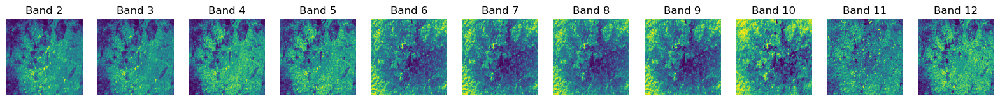

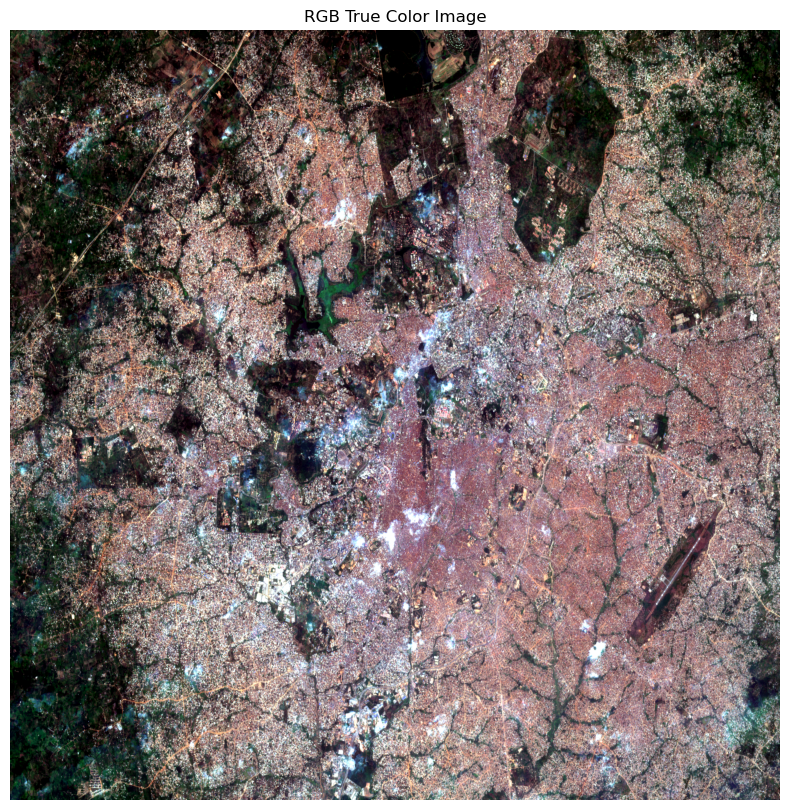

In [15]:
### Enhanced image: plot all the bands
fig = s2u.plot_bands(enhanced_image_data)
plot_path = os.path.join(plot_dir, "enhanced_resized_spectral_bands_Ibadan.pdf")
fig.savefig(plot_path, bbox_inches='tight', dpi=300)

### Enhanced image: plot the RGB true color image
fig = s2u.plot_rgb(enhanced_image_data, rgb_indices=(3, 2, 1))
plot_path = os.path.join(plot_dir, "RGB_or_composite_enhanced_resized_image_Ibadan.pdf")
fig.savefig(plot_path, bbox_inches='tight', dpi=300)


### Read the created patches/tiles and show their images

#### Bands tiles level: original image data

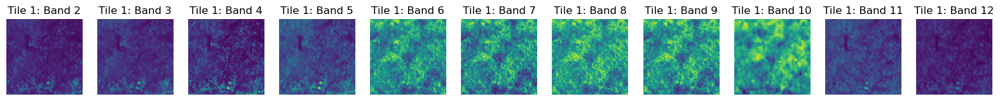

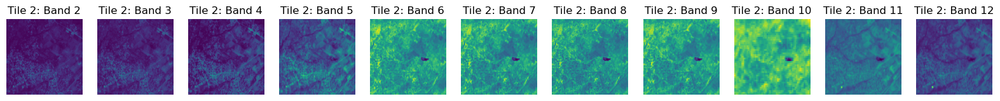

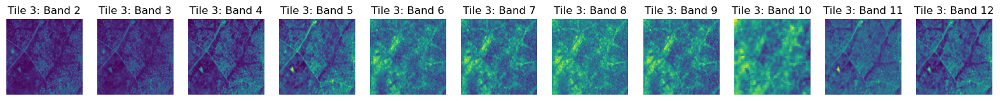

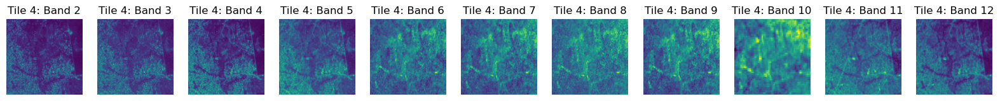

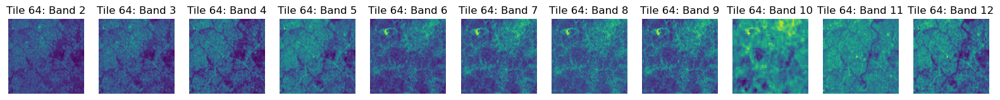

In [16]:
### Original image: plot all the bands
fig = s2u.plot_bands(patches[0], patch_id="Tile 1")
fig = s2u.plot_bands(patches[1], patch_id="Tile 2")
fig = s2u.plot_bands(patches[2], patch_id="Tile 3")
fig = s2u.plot_bands(patches[3], patch_id="Tile 4")
fig = s2u.plot_bands(patches[-1], patch_id=f"Tile {len(patches)}")


#### Bands tiles level: enhanced image data

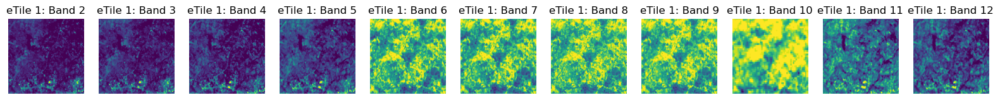

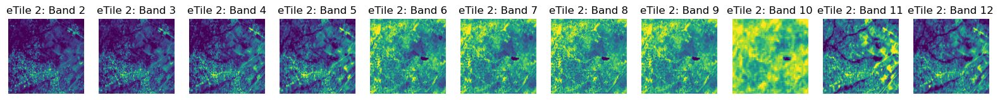

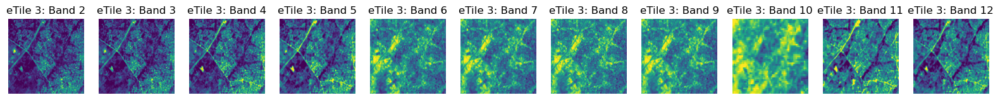

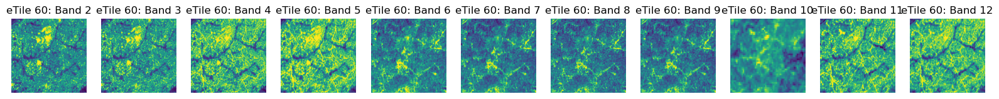

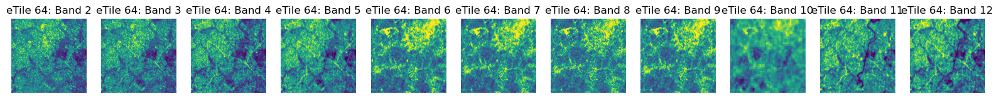

In [17]:
### Enhanced image: plot all the bands
fig = s2u.plot_bands(enhanced_patches[0], patch_id="eTile 1")
fig = s2u.plot_bands(enhanced_patches[1], patch_id="eTile 2")
fig = s2u.plot_bands(enhanced_patches[2], patch_id="eTile 3")
fig = s2u.plot_bands(enhanced_patches[-4], patch_id=f"eTile {len(patches)-4}")
fig = s2u.plot_bands(enhanced_patches[-1], patch_id=f"eTile {len(patches)}")


#### Show the true RBG image at the tiles/patches level

In [12]:
from glob import glob


##### Bands tiles level: original image data

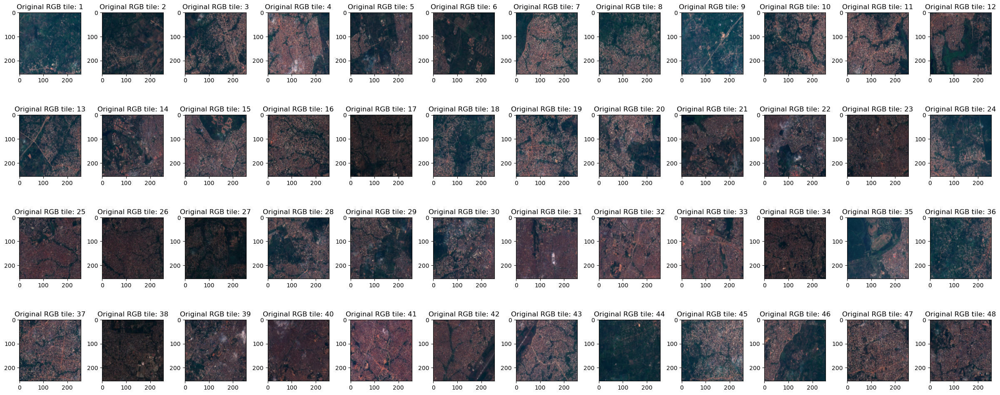

In [22]:
### Original image true RGB patches
tiff_list = sorted(glob(f"{patch_dir}/*"))

# Open and read the raster image
raster_imgs = []
for path in tiff_list[:(4*12)]:
    raster_img = rpp.read_sentinel_image(path)
    raster_imgs.append(raster_img)

# Plot the RGB true color image
fig, axes = plt.subplots(4, 12, figsize=(24, 10))
axes = axes.reshape(-1)
for i in range(len(axes)):
    s2u.plot_rgb(raster_imgs[i][0], rgb_indices=(3, 2, 1), ax=axes[i])
    axes[i].set_title(f"Original RGB tile: {i+1}")

fig.tight_layout();

# Save figure
# plot_path = os.path.join(plot_dir, "examples_of_tiles_of_RGB_Ibanda.pdf")
# fig.savefig(plot_path, bbox_inches='tight', dpi=300)


##### Bands tiles level: enhanced image data

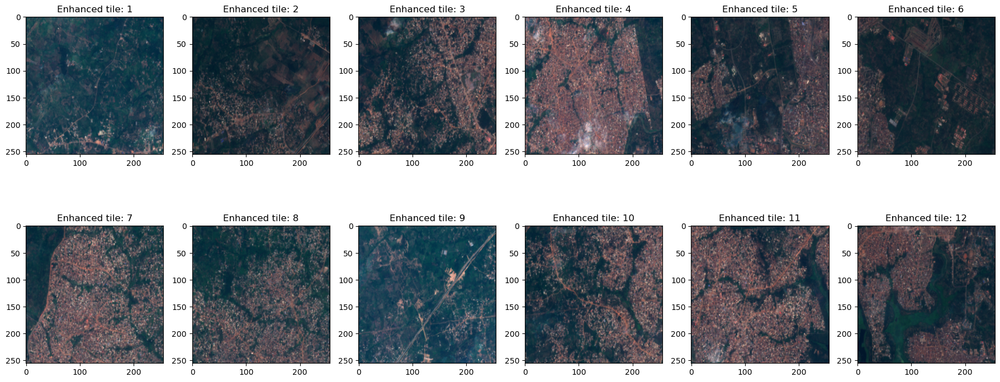

In [27]:
### Enhanced image true RGB patches
tiff_list = sorted(glob(f"{enhanced_patch_dir}/*"))

# Open and read the raster image
raster_imgs = []
for path in tiff_list[:(4*6)]:
    raster_img = rpp.read_sentinel_image(path)
    raster_imgs.append(raster_img)

# Plot the RGB true color image
fig, axes = plt.subplots(2, 6, figsize=(18, 8))
axes = axes.reshape(-1)
for i in range(len(axes)):
    s2u.plot_rgb(raster_imgs[i][0], rgb_indices=(3, 2, 1), ax=axes[i])
    axes[i].set_title(f"Enhanced tile: {i+1}")

fig.tight_layout();


## Spectral Indix Preprocessing

### Open and Read bands, Preprocess and Calculate pectral indices, and Create the data frame

In [13]:
image_list = [resized_output_file]
aoi = "Ibadan"
s2df_train_data = spt.read_bands_make_indices(image_list, aoi)
s2df_train_data


,B2_Ibadan,B3_Ibadan,B4_Ibadan,B5_Ibadan,B6_Ibadan,B7_Ibadan,B8_Ibadan,B8A_Ibadan,B9_Ibadan,B11_Ibadan,...,savi_Ibadan,mndwi_Ibadan,nmdi_Ibadan,ndwi_Ibadan,ui_Ibadan,nbi_Ibadan,brba_Ibadan,nbai_Ibadan,mbi_Ibadan,baei_Ibadan
0,0.208264,0.199423,0.171012,0.204991,0.376449,0.439621,0.408066,0.474842,0.154700,0.305378,...,-0.029632,-0.209896,-0.382128,-0.343452,0.363986,0.337577,0.560000,-0.525560,0.018322,0.933065
1,0.208038,0.198966,0.172388,0.206100,0.368850,0.432350,0.408738,0.470200,0.154700,0.309650,...,-0.032080,-0.217619,-0.373107,-0.345189,0.354374,0.345056,0.556720,-0.521960,0.018886,0.928773
2,0.209839,0.201806,0.172112,0.209759,0.367645,0.424408,0.410991,0.454272,0.154700,0.310141,...,-0.031589,-0.211613,-0.363325,-0.341361,0.338475,0.345049,0.554949,-0.519271,0.019275,0.922190
3,0.209751,0.203480,0.175961,0.209278,0.362702,0.419026,0.397415,0.448299,0.154463,0.312194,...,-0.038832,-0.210819,-0.356463,-0.322742,0.333832,0.355644,0.563627,-0.516016,0.021070,0.922987
4,0.209441,0.200593,0.173456,0.206500,0.348250,0.405700,0.386153,0.436100,0.153750,0.318200,...,-0.035733,-0.226693,-0.339657,-0.316252,0.325384,0.358982,0.545115,-0.519685,0.021525,0.912609
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4194299,0.221941,0.212091,0.201453,0.226750,0.295750,0.334800,0.319845,0.362500,0.142400,0.339900,...,-0.104970,-0.231541,-0.264557,-0.202569,0.192414,0.480856,0.592683,-0.553678,0.050902,0.908443
4194300,0.218034,0.208824,0.192091,0.217339,0.289927,0.330149,0.308524,0.355432,0.142400,0.324739,...,-0.089320,-0.217246,-0.276916,-0.192712,0.206051,0.438059,0.591525,-0.546381,0.042656,0.922273
4194301,0.217889,0.208399,0.191058,0.213900,0.287800,0.328450,0.307258,0.352850,0.142400,0.319200,...,-0.087571,-0.210010,-0.282647,-0.191715,0.211210,0.428270,0.598552,-0.541979,0.040383,0.930741
4194302,0.218940,0.206948,0.189809,0.211368,0.291726,0.337324,0.310826,0.364302,0.142400,0.310233,...,-0.085451,-0.199707,-0.305558,-0.200624,0.229557,0.413518,0.611826,-0.539231,0.037373,0.947074


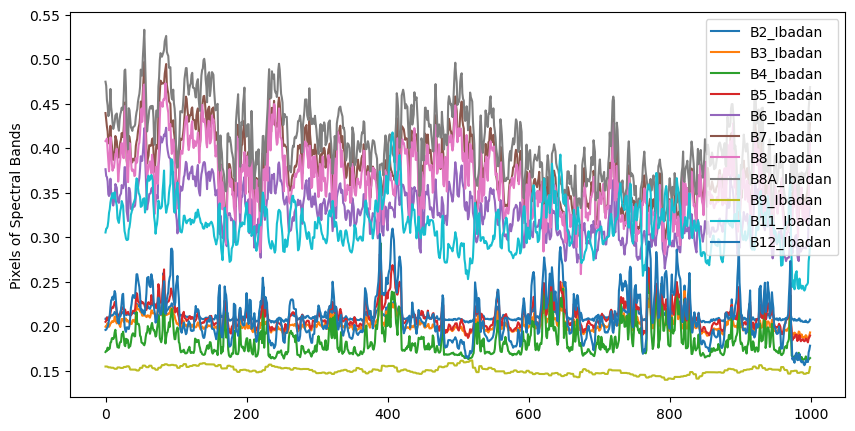

In [14]:
fig, ax = plt.subplots(figsize=(10, 5))
s2df_train_data.iloc[:1000,:11].plot(ax=ax)
ax.set_ylabel("Pixels of Spectral Bands");


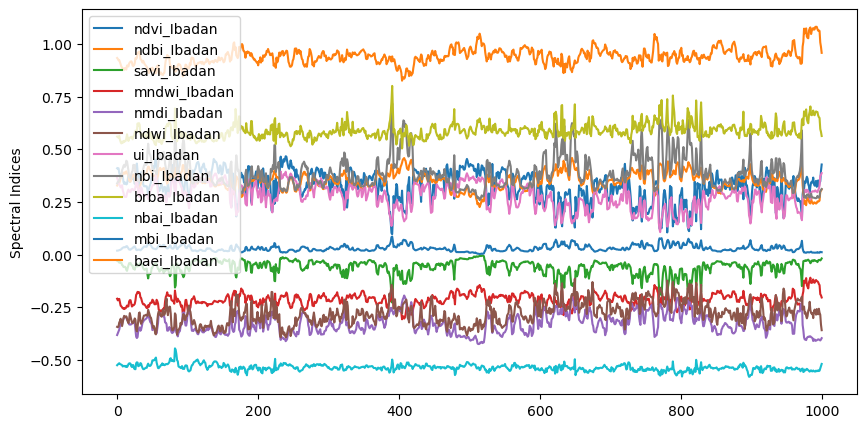

In [15]:
fig, ax = plt.subplots(figsize=(10, 5))

s2df_train_data.iloc[:1000,11:].plot(ax=ax)
ax.set_ylabel("Spectral Indices");


#### Save the Sentinel-2A derived training dataframe

In [16]:
### Check and create its directory
derived_train_dir = os.path.join(proc_data_dir, "Ibadan/S2")
check_create_dir(derived_train_dir)

derived_train_file_csv = os.path.join(derived_train_dir, "S2A_Ibadan_train_bands_spectral_indices_dataframe.csv")
derived_train_file_parquet = os.path.join(derived_train_dir, "S2A_Ibadan_train_bands_spectral_indices_dataframe.parquet")

### Save as a csv file
s2df_train_data.to_csv(derived_train_file_csv)


The folder '/Users/ldjeutsch/PYTHON-DATA-SCI/UMP/Deliverables/outputs/processed-data/Ibadan/S2' already exists


In [17]:
### Save as a parquet file
s2df_train_data.to_parquet(derived_train_file_parquet, engine='fastparquet')


### Calculate the spectral indices of interest

In [18]:
### Calculate spectral indices
raster_image_file = resized_output_file[:]
indices_list = ["NDVI", "NDBI", "NDWI", "MNDWI", "SAVI", "UI", "NMDI"]
spectral_indices, metadata = spt.calculate_all_spectral_indices(raster_image_file, indices_list)


In [20]:
spectral_indices.keys()


dict_keys(['NDVI', 'NDBI', 'NDWI', 'MNDWI', 'SAVI', 'UI', 'NMDI'])

In [21]:
spectral_indices["NDBI"]


array([[0.32750538, 0.33369228, 0.3343958 , ..., 0.30651557, 0.29137442,
        0.27288014],
       [0.32832283, 0.3343957 , 0.334766  , ..., 0.30854136, 0.29276294,
        0.27344894],
       [0.33849707, 0.34316954, 0.33941537, ..., 0.3331881 , 0.3098737 ,
        0.2805704 ],
       ...,
       [0.31592613, 0.31870878, 0.3207724 , ..., 0.3860084 , 0.3848686 ,
        0.38354978],
       [0.31612784, 0.31944597, 0.320655  , ..., 0.3832358 , 0.37184575,
        0.3581869 ],
       [0.31112507, 0.31388336, 0.31531167, ..., 0.38301563, 0.370793  ,
        0.35609314]], dtype=float32)

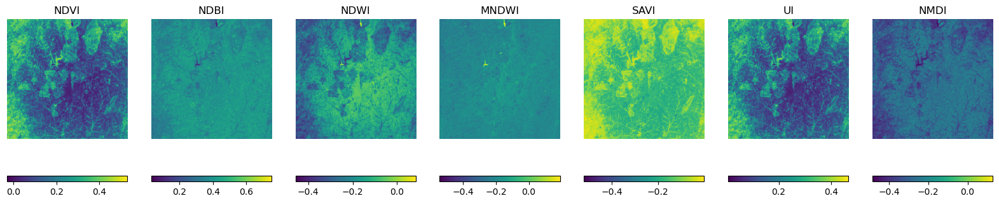

In [24]:
### Plot all the calculated spectral indices of interest and save the figure
fig = spt.plot_spectral_indices(spectral_indices)
plot_path = os.path.join(plot_dir, "selected_spectral_indices_of_interest_Ibadan.pdf")
fig.savefig(plot_path, bbox_inches='tight', dpi=300)


#### Save rasterized spectral indices

In [27]:
### Write the rasterized spectral indices as individual .tiff files
for index_name in spectral_indices.keys():
    index_image = spectral_indices[index_name]
    output_path = os.path.join(spectral_indices_dir,
                               f"{index_name}_{target_height}x{target_width}.tif")
    spt.write_rasterized_spectral_index(index_image, output_path, metadata)
    rpp.save_image(resized_image, resized_output_file, metadata)
